# Extract the spectrum of CTIO Data in May 2017
==================================================================================================

- author : Sylvie Dagoret-Campagne and Jérémy Neveu
- date   : May 31st 2017


- The goal is to extract the spectrum after the rotation.


-1) First the 1 orders are extracted. One must check the rotation is correct

-2) Check the 2 orders are well aligned along X by looking at the transverse profile : if you see two peaks this means the rotation is bad.

-3) For this the central star light must having been turned off.

In [4]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [5]:
print theNotebook

Extract_Spectrum


In [6]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np

from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os
import sys
sys.path.append("../../common_tools/")
from scan_holo import *

In [7]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.2.0


In [8]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal
from matplotlib import cm

In [9]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.2.0


In [10]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [11]:
%load_ext Cython

In [12]:
from IPython.display import Image, display

In [13]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [14]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [15]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

In [16]:
def subplots_adjust(*args, **kwargs):
    """
    call signature::

      subplots_adjust(left=None, bottom=None, right=None, top=None,
                      wspace=None, hspace=None)

    Tune the subplot layout via the
    :class:`matplotlib.figure.SubplotParams` mechanism.  The parameter
    meanings (and suggested defaults) are::

      left  = 0.125  # the left side of the subplots of the figure
      right = 0.9    # the right side of the subplots of the figure
      bottom = 0.1   # the bottom of the subplots of the figure
      top = 0.9      # the top of the subplots of the figure
      wspace = 0.2   # the amount of width reserved for blank space between subplots
      hspace = 0.2   # the amount of height reserved for white space between subplots

    The actual defaults are controlled by the rc file
    """
    fig = gcf()
    fig.subplots_adjust(*args, **kwargs)
    draw_if_interactive()

### Output directory for images generated in the notebook view (not true fits images)

In [17]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images

In [18]:
ensure_dir(dir_top_images) # create that directory

### Input fits file

In [19]:
inputdir="./rotated_fitsimages"
MIN_IMGNUMBER=156
MAX_IMGNUMBER=180
holo_name = 'Ron400'
object_name='HD205905 June 9th 2017'
SelectTagRe='^rotimg_20170609_([0-9]+).fits$' # regular expression to select the file
SearchTagRe='^rotimg_20170609_[0-9]+.fits$'
NBIMGPERROW=2

### output fits file

In [20]:
outputdir="./spectrum_fitsspec"

In [21]:
ensure_dir(outputdir)

## Location of corrected images
----------------------------------

In [22]:
input_filelist=os.listdir(inputdir) 

In [23]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [24]:
input_filelist[:5]
print len(input_filelist)

25


In [25]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [26]:
#%%cython

import numpy as np
import re

def MakeFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list

    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file
            if re.search('.*fits$',filename):  #example of filename filter
                num_str=re.findall(SelectTagRe,file)[0]
                index=int(num_str)
                filelist_fitsimages.append(filename)
                indexes_files.append(index)
    return indexes_files, filelist_fitsimages

In [27]:
indexes_files, filelist_fitsimages=MakeFileList(inputdir,input_filelist)   # Make the list

In [28]:
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [29]:
print indexes_files

[156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173
 174 175 176 177 178 179 180]


In [30]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [31]:
sorted_numbers=indexes_files[sorted_indexes]

In [32]:
print sorted_indexes

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]


In [33]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [34]:
#sorted_files

## Build full filename
----------------------------

In [35]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [36]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

In [37]:
print sorted_filenames.shape

(25,)


## Acces to data of  images
----------------------------------

In [38]:
all_dates = []
all_airmass = []
all_images = []
all_titles = []
all_header = []
all_img = []
all_filt= []

In [39]:
%%cython

import numpy as np
from astropy.io import fits

def BuildImages(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawImages
    ===============
    """

    
    all_dates = []
    all_airmass = []
    all_images = []
    all_titles = []
    all_header = []
    all_expo = []
    all_filt= []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        expo = header['EXPTIME']
        filters = header['FILTERS'].split(' ')[1]
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        image_corr=hdu_list[0].data
        image=image_corr
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        all_images.append(image)
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        all_filt.append(filters)
        hdu_list.close()
        
    return all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt

In [40]:
all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

## Show images
-----------------------

In [41]:
len(all_images)

25

In [42]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os
    
left_edge = 0
right_edge = 1800    

def ShowImages(all_images,all_titles,object_name,dir_top_images,all_filt):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    It returns the x0, where the maximum occurs in the image
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERROW)+1
    thex0 = []
  
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,4*MAXIMGROW))
    f.tight_layout()
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        image = all_images[index][:,left_edge:right_edge]
        xprofile=np.sum(image,axis=0)
        x0=np.where(xprofile==xprofile.max())[0][0]
        thex0.append(x0)
        im=axarr[iy,ix].imshow(image,origin='lower',cmap='rainbow',vmin=0,vmax=800)
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(color='white', ls='solid')
        axarr[iy,ix].text(1000.,175.,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
        
    title='Images of {}'.format(object_name)
    plt.suptitle(title,size=16)
    
    figfilename=os.path.join(dir_top_images,'intput_images.pdf')
    plt.savefig(figfilename)  
    
    return thex0

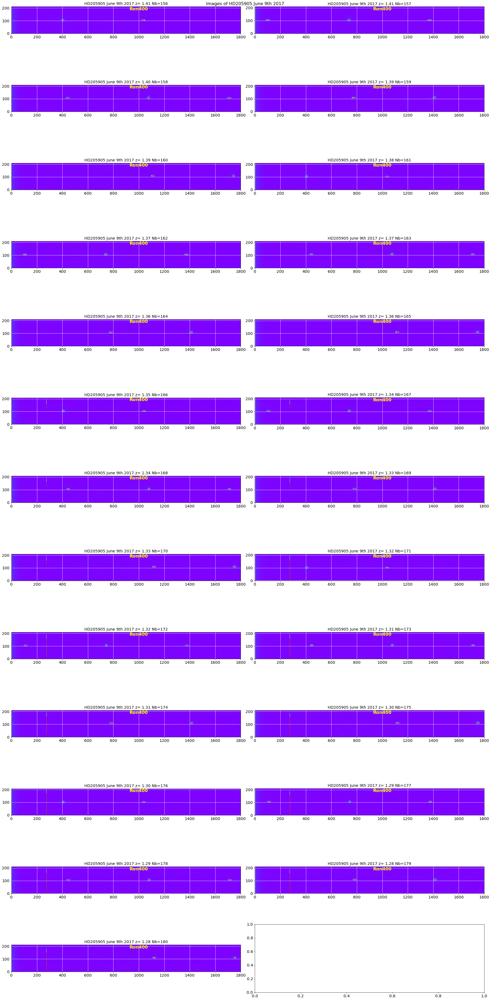

In [43]:
thex0=ShowImages(all_images,all_titles,object_name,dir_top_images,all_filt)

## Visualisation des spectres

In [44]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os



def ShowOneOrder(all_images,all_titles,thex0,object_name,all_expo,dir_top_images,figname):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERROW)+1
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,5*MAXIMGROW))
    f.tight_layout()
    for index in np.arange(0,NBIMAGES):
        
        print index, 'exposition time = ',all_expo[index] 
        
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        full_image=np.copy(all_images[index])
        
        if(all_expo[index]<=0 ): #special case of the first image
            reduc_image=full_image[90:150,thex0[index]+100:2048]  
        else:
            reduc_image=full_image[90:150,thex0[index]+100:2048]/all_expo[index] 
        X,Y=np.meshgrid(np.arange(0,reduc_image.shape[1]),np.arange(reduc_image.shape[0]))
        im = axarr[iy,ix].pcolormesh(X,Y,reduc_image, cmap='rainbow',vmin=0,vmax=100)
        #axarr[iy,ix].colorbar(im, orientation='vertical')
        axarr[iy,ix].axis([X.min(), X.max(), Y.min(), Y.max()]); axarr[iy,ix].grid(True)
        
        axarr[iy,ix].set_title(all_titles[index])
        
    
    title='Images of {}'.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,figname)
    #plt.savefig(figfilename) 

0 exposition time =  20.0
1 exposition time =  20.0
2 exposition time =  20.0
3 exposition time =  20.0
4 exposition time =  20.0
5 exposition time =  20.0
6 exposition time =  20.0
7 exposition time =  20.0
8 exposition time =  20.0
9 exposition time =  20.0
10 exposition time =  20.0
11 exposition time =  20.0
12 exposition time =  20.0
13 exposition time =  20.0
14 exposition time =  20.0
15 exposition time =  20.0
16 exposition time =  20.0
17 exposition time =  20.0
18 exposition time =  20.0
19 exposition time =  20.0
20 exposition time =  20.0
21 exposition time =  20.0
22 exposition time =  20.0
23 exposition time =  20.0
24 exposition time =  20.0


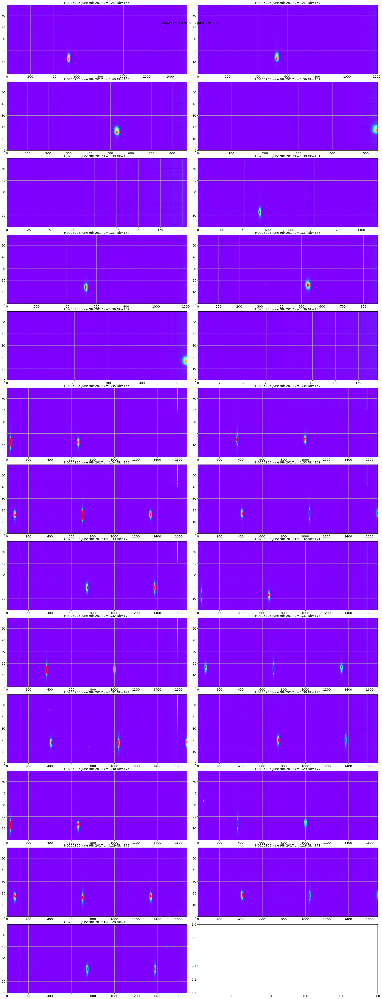

In [45]:
ShowOneOrder(all_images,all_titles,thex0,object_name,all_expo,dir_top_images,'firstorderright.pdf')

### Shows the transverse profile

In [46]:
DeltaX=600
w=20
ws=70

In [47]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os

def ShowTransverseProfile(all_images,thex0,all_titles,object_name,all_expo,dir_top_images):
    """
    ShowTransverseProfile: Show the raw images without background subtraction
    =====================
    The goal is to see in y, where is the spectrum maximum. Returns they0
    
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERROW)+1
    ### Criteria for spectrum region selection
    DeltaX=1000
    w=10
    ws=80
    Dist=4*w
    right_edge = 2048
    
    thespectra= []
    thespectraUp=[]
    thespectraDown=[]
    
    they0 = []
    
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,4*MAXIMGROW))
    f.tight_layout()
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        data=np.copy(all_images[index])[:,0:right_edge]

        
        #data[:,x0-100:x0+100]=0 ## TURN OFF CENTRAL STAR
        
        if(all_expo[index]<=0):            
            yprofile=np.sum(data,axis=1)
        else:
            yprofile=np.sum(data,axis=1)/all_expo[index]
            
            
        ymin=1
        ymax=yprofile.max()
        y0=np.where(yprofile==ymax)[0][0]
        they0.append(y0)
        #y0 = they0[index]
        #im=axarr[iy,ix].imshow(data,vmin=-10,vmax=50)
        axarr[iy,ix].semilogy(yprofile)
        axarr[iy,ix].semilogy([y0,y0],[ymin,ymax],'r-')
        axarr[iy,ix].semilogy([y0-w,y0-w],[ymin,ymax],'k-')
        axarr[iy,ix].semilogy([y0+w,y0+w],[ymin,ymax],'k-')
        
        ##########################################################
        #### Here extract the spectrum around the central star
        #####   Take the sum un bins along y
        #############################################################
        
        spectrum2D=np.copy(data[y0-w:y0+w,:])
        xprofile=np.sum(spectrum2D,axis=0)

        
        ### Lateral bands to remove sky background
        ### ---------------------------------------
        spectrum2DUp=np.copy(data[y0-w+Dist:y0+w+Dist,:])
        xprofileUp=np.median(spectrum2DUp,axis=0)*2.*float(w)

        spectrum2DDown=np.copy(data[y0-w-Dist:y0+w-Dist,:])
        xprofileDown=np.median(spectrum2DDown,axis=0)*2.*float(w)
        
        
        if(all_expo[index]<=0):
            thespectra.append(xprofile)
            thespectraUp.append(xprofileUp)
            thespectraDown.append(xprofileDown)
        else:  ################## HERE I NORMALISE WITH EXPO TIME ####################################
            thespectra.append(xprofile/all_expo[index])
            thespectraUp.append(xprofileUp/all_expo[index]) 
            thespectraDown.append(xprofileDown/all_expo[index]) 

        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
    title='Spectrum tranverse profile '.format(object_name)
    plt.suptitle(title,size=16)
    
    figfilename=os.path.join(dir_top_images,'transverse_profile.pdf')
    plt.savefig(figfilename)  
    
    return thespectra,thespectraUp,thespectraDown,they0

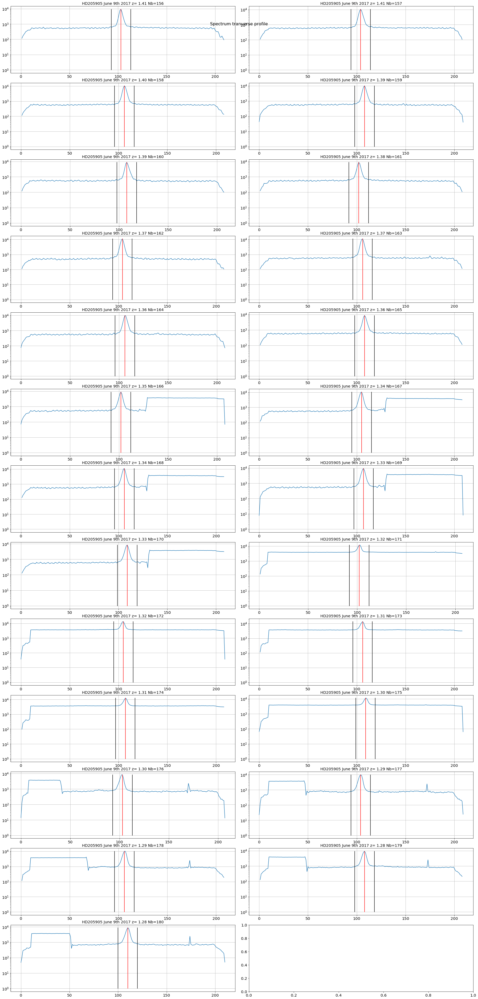

In [48]:
thespectra,thespectraUp,thespectraDown,they0=ShowTransverseProfile(all_images,thex0,all_titles,object_name,all_expo,dir_top_images)

## Order 0 precise position

In [49]:
print they0
print thex0

[103, 104, 106, 108, 108, 102, 104, 106, 106, 108, 102, 105, 106, 107, 109, 102, 105, 106, 107, 109, 103, 104, 106, 108, 110]
[404, 741, 1077, 1412, 1742, 406, 741, 1079, 1414, 1751, 273, 273, 273, 273, 273, 274, 274, 274, 274, 274, 274, 274, 274, 274, 274]


La position de l'ordre zéro doit etre connue le plus précisément possible pour ensuite déterminer le nombre de traits par millimètre du réseau.

In [50]:
textfilename = os.path.join('./cut_fitsimages/star_centroids.txt')
central_positions = (np.loadtxt(textfilename)).astype(int)
xguess = central_positions.T[1].astype(int)
print xguess

[ 398  740 1076 1403 1741  405  733 1078 1406 1743  406  741 1077 1410 1751
  405  743 1078 1407 1752  405  744 1079 1410 1752]


In [51]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
from tools import *

def FindCentralStarPosition(all_images,xguess_positions,yguess_positions):
    """
    ComputeStatImages: 
    ==============
    """
    w=30 # size of the window in pixel
    
    x_star = []
    y_star = []
    NBIMGPERLROW = 5
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERLROW)

    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(25,5*MAXIMGROW))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERLROW
        iy=index/NBIMGPERLROW
        xguess = xguess_positions[index]
        yguess = yguess_positions[index]
        sub = all_images[index][yguess-w:yguess+w,xguess-w:xguess+w]

        axarr[iy,ix].imshow(sub,origin='lower',cmap='rainbow',vmin=0, vmax=20)
        axarr[iy,ix].grid(color='white', ls='solid')
        max_loc = np.where(sub==np.max(sub))
        axarr[iy,ix].scatter(max_loc[1],max_loc[0],s=200,facecolor='black')
        x_star.append(max_loc[1][0]+xguess-w)
        y_star.append(max_loc[0][0]+yguess-w)
        # projection along y :
        xprofile = np.sum(sub,axis=0)
        popt, pcov = fit_gauss(np.arange(0,xprofile.shape[0]),xprofile,guess=(10000,w,w))
        x_mean = popt[1]
        # projection along x :
        yprofile = np.sum(sub,axis=1)
        popt, pcov = fit_gauss(np.arange(0,yprofile.shape[0]),yprofile,guess=(10000,w,w))
        y_mean = popt[1]
        print 'Max localisation: ',max_loc[1],max_loc[0], '  Gauss center localisation: ', x_mean, y_mean
        axarr[iy,ix].scatter([x_mean],[y_mean],s=200,facecolor='green')
    x_star = np.array(x_star).astype(int)
    y_star = np.array(y_star).astype(int)
    plt.show()

    return x_star, y_star

Max localisation:  [36] [30]   Gauss center localisation:  34.10683069 29.7976001002
Max localisation:  [31] [30]   Gauss center localisation:  30.7496234048 30.1636462207
Max localisation:  [31] [30]   Gauss center localisation:  30.9532564757 30.3306764051
Max localisation:  [40] [30]   Gauss center localisation:  39.2727607979 29.9842298884
Max localisation:  [31] [30]   Gauss center localisation:  30.7105204359 30.0133338488
Max localisation:  [31] [30]   Gauss center localisation:  30.6870915168 30.2256613421
Max localisation:  [38] [30]   Gauss center localisation:  38.0803103004 29.7823533206
Max localisation:  [31] [30]   Gauss center localisation:  30.7130721534 29.7430463667
Max localisation:  [38] [30]   Gauss center localisation:  37.4877495674 30.4394509238
Max localisation:  [38] [30]   Gauss center localisation:  37.588543728 30.1045426429
Max localisation:  [31] [30]   Gauss center localisation:  31.0533811356 29.8999326484
Max localisation:  [31] [30]   Gauss center lo

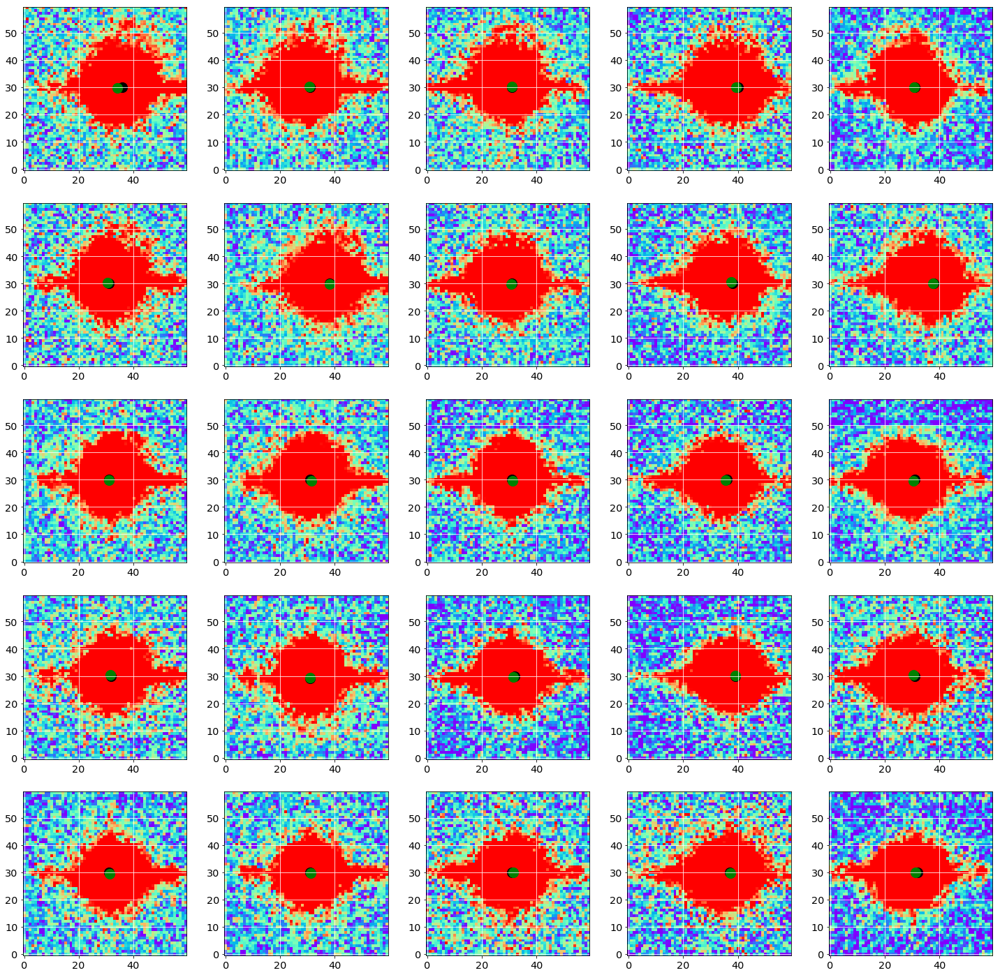

In [52]:
x_star,y_star = FindCentralStarPosition(all_images,xguess,they0)

In [53]:
print x_star
print xguess
print thex0
print np.array(x_star)-np.array(thex0)
print np.array(x_star)-np.array(xguess)

[ 404  741 1077 1413 1742  406  741 1079 1414 1751  407  742 1078 1416 1752
  407  744 1080 1416 1753  406  745 1080 1417 1754]
[ 398  740 1076 1403 1741  405  733 1078 1406 1743  406  741 1077 1410 1751
  405  743 1078 1407 1752  405  744 1079 1410 1752]
[404, 741, 1077, 1412, 1742, 406, 741, 1079, 1414, 1751, 273, 273, 273, 273, 273, 274, 274, 274, 274, 274, 274, 274, 274, 274, 274]
[   0    0    0    1    0    0    0    0    0    0  134  469  805 1143 1479
  133  470  806 1142 1479  132  471  806 1143 1480]
[ 6  1  1 10  1  1  8  1  8  8  1  1  1  6  1  2  1  2  9  1  1  1  1  7  2]


In [54]:
thex0 = x_star
they0 = y_star

In [55]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os

def ShowRightOrder(all_images,thex0,they0,all_titles,object_name,all_expo,dir_top_images):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERROW)+1
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,4*MAXIMGROW))
    f.tight_layout()
    
    right_edge = 2048
    
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        full_image=np.copy(all_images[index])[:,0:right_edge]
        y_0=they0[index]
        x_0=thex0[index]

        reduc_image=full_image[y_0-20:y_0+20,x_0+100:right_edge]/all_expo[index]
        
        X,Y=np.meshgrid(np.arange(0,reduc_image.shape[1]),np.arange(reduc_image.shape[0]))
        im = axarr[iy,ix].pcolormesh(X,Y,reduc_image, cmap='rainbow',vmin=0,vmax=100)
        #axarr[iy,ix].colorbar(im, orientation='vertical')
        axarr[iy,ix].axis([X.min(), X.max(), Y.min(), Y.max()]); axarr[iy,ix].grid(True)
        
        axarr[iy,ix].set_title(all_titles[index])
        
    
    title='Right part of spectrum of {} '.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,'rightorder.pdf')
    
    #plt.savefig(figfilename)  

In [56]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os

def ShowLeftOrder(all_images,thex0,they0,all_titles,object_name,all_expo,dir_top_images):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERROW)+1
    #thex0 = []
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,4*MAXIMGROW))
    f.tight_layout()

    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        full_image=np.copy(all_images[index])
        y_0=they0[index]
        x_0=thex0[index]
        
        
        reduc_image=full_image[y_0-20:y_0+20,0:x_0-100]/all_expo[index] 

        X,Y=np.meshgrid(np.arange(0,reduc_image.shape[1]),np.arange(reduc_image.shape[0]))
        im = axarr[iy,ix].pcolormesh(X,Y,reduc_image, cmap='rainbow',vmin=0,vmax=30)
        #axarr[iy,ix].colorbar(im, orientation='vertical')
        axarr[iy,ix].axis([X.min(), X.max(), Y.min(), Y.max()]); axarr[iy,ix].grid(True)
        
        axarr[iy,ix].set_title(all_titles[index])
        
    
    title='Left part of spectrum of '.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,'leftorder.pdf')
    #plt.savefig(figfilename)  

### Right order

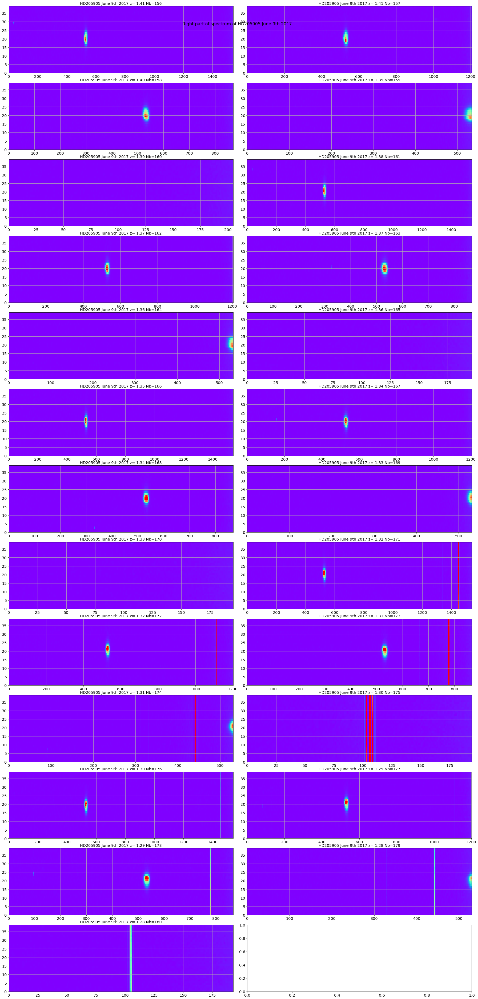

In [57]:
ShowRightOrder(all_images,thex0,they0,all_titles,object_name,all_expo,dir_top_images)

### Left order

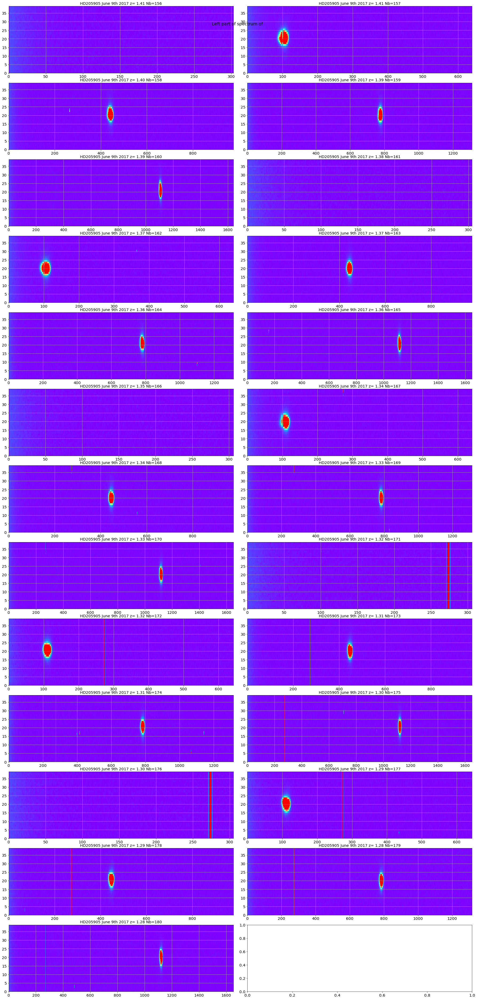

In [58]:
ShowLeftOrder(all_images,thex0,they0,all_titles,object_name,all_expo,dir_top_images)

In [59]:
def CleanBadPixels(spectraUp,spectraDown):
    
    Clean_Up= []
    Clean_Do = []
    Clean_Av = []
    eps=25.   # this is the minumum background Please check
    NBSPEC=len(spectraUp)
    for index in np.arange(0,NBSPEC):
        s_up=spectraUp[index]
        s_do=spectraDown[index]
    
        index_up=np.where(s_up<eps)
        index_do=np.where(s_do<eps)
        
        s_up[index_up]=s_do[index_up]
        s_do[index_do]=s_up[index_do]
        s_av=(s_up+s_do)/2.
        
        Clean_Up.append(s_up)
        Clean_Do.append(s_do)
        Clean_Av.append(s_av)
        
    return Clean_Up, Clean_Do,Clean_Av 

In [60]:
Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

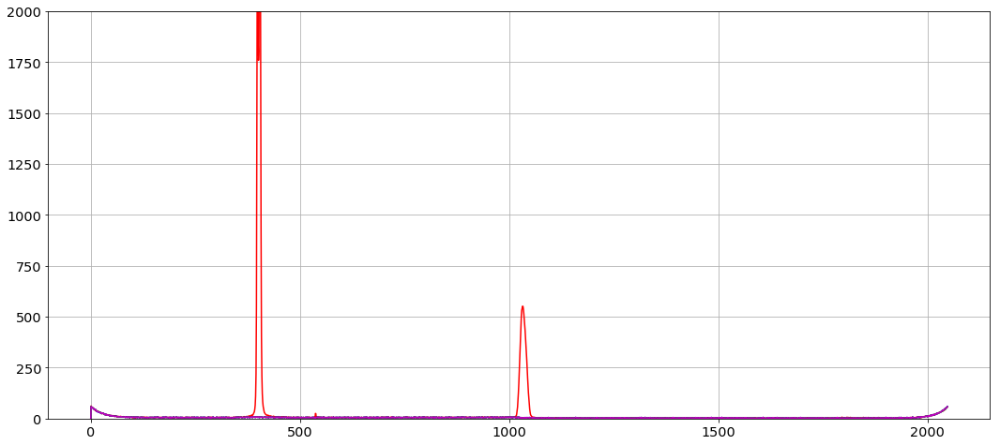

In [61]:
sel=0
plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(Clean_Up[sel],'b-') 
plt.plot(Clean_Do[sel],'g-')
plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,2000.)
figfilename=os.path.join(dir_top_images,'bckg_sample.pdf')
plt.savefig(figfilename) 

In [62]:
def ShowLongitBackground(spectra,spectraUp,spectraDown,spectraAv,all_titles,object_name,dir_top_images):
    """
    Show the background to be removed to the spectrum
    """
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/NBIMGPERROW)+1
    
   
    
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,5*MAXIMGROW))
    f.tight_layout()
    for index in np.arange(0,NBSPEC):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        axarr[iy,ix].plot(spectra[index],'r-')
        axarr[iy,ix].plot(spectraUp[index],'b-')
        axarr[iy,ix].plot(spectraDown[index],'g-')
        axarr[iy,ix].plot(spectraAv[index],'m-')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,spectra[index][:1900].max()*1.2)
        axarr[iy,ix].text(1400.,spectra[index][:1900].max()*1.1, all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
    title='Longitudinal background Up/Down'.format(object_name)
    plt.suptitle(title,size=16)
    
    figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
    plt.savefig(figfilename)  
    

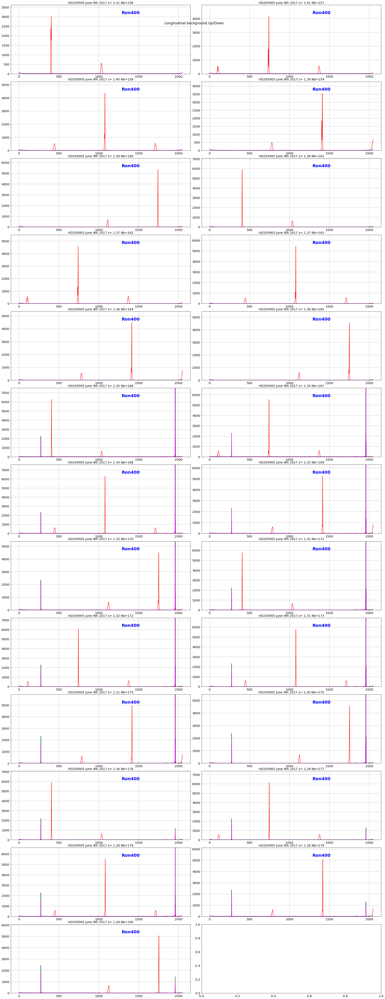

In [63]:
ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,object_name,dir_top_images)

In [64]:
def CorrectSpectrumFromBackground(spectra, background):
    """
    Background Subtraction
    """
    NBSPEC=len(spectra)
        
    corrected_spectra = []
    
    for index in np.arange(0,NBSPEC):
        corrspec=spectra[index]-background[index]
        corrected_spectra.append(corrspec)
    return corrected_spectra

In [65]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

In [66]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os

def ShowSpectrumProfile(spectra,all_titles,object_name,dir_top_images,all_filt):
    """
    ShowSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    NBIMGPERROW=2
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/NBIMGPERROW)+1
    #MaxY= [150.,150.,150.,5000.,1500.,1000.,5000.,5000.,500.,150.]
    
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,5*MAXIMGROW))
    f.tight_layout()
    for index in np.arange(0,NBSPEC):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        axarr[iy,ix].plot(spectra[index],'r-')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,spectra[index][:1800].max()*1.2)
        axarr[iy,ix].text(1000.,spectra[index][:1800].max()*1.1, all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
    
    title='Spectrum 1D profile and background Up/Down for {}'.format(object_name)
    plt.suptitle(title,size=16)
    
    figfilename=os.path.join(dir_top_images,'correctedspectrum_profile.pdf')
    plt.savefig(figfilename)  
    

#### Here below, we plot the latera (up and down ) background which has not been subtracted
For me the background remains flat and at zero


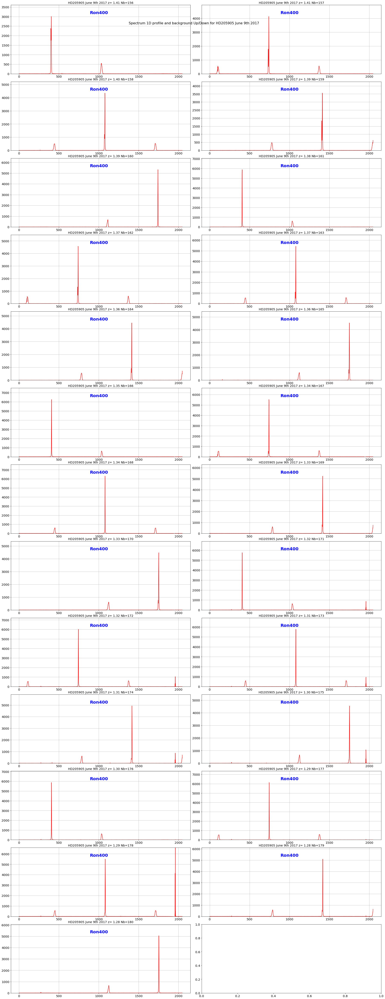

In [67]:
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,dir_top_images,all_filt)

In [68]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os


def ShowSpectrumRightProfile2(spectra,thex0,all_titles,object_name,dir_top_images,all_filt):
    """
    ShowSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    NBIMGPERROW=2
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/NBIMGPERROW)+1
    #MaxY= [150.,150.,150.,5000.,1500.,1000.,5000.,5000.,500.,150.]
    
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,5*MAXIMGROW))
    f.tight_layout()
    for index in np.arange(0,NBSPEC):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        axarr[iy,ix].plot(spectra[index],'r-')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,spectra[index][:1900].max()*1.2)
        axarr[iy,ix].set_xlim(thex0[index]+100,2000.)
        axarr[iy,ix].text(thex0[index]+300,spectra[index][:1900].max()*1.1, all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
    
    title='Spectrum 1D profile and background Up/Down for {}'.format(object_name)
    plt.suptitle(title,size=16)
    
    figfilename=os.path.join(dir_top_images,'correctedspectrum_profile2.pdf')
    plt.savefig(figfilename)  
    


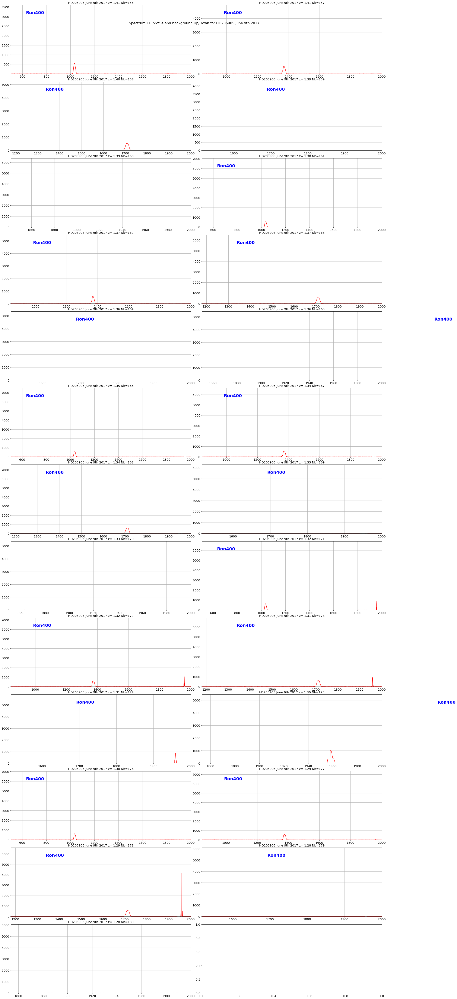

In [69]:
ShowSpectrumRightProfile2(thecorrspectra,thex0,all_titles,object_name,dir_top_images,all_filt)

## Ratio between amplitudes

In [70]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os

def SpectrumAmplitudeRatio(spectra):
    """
    SpectrumAmplitudeRatio: ratio of amplitudes
    =====================
    """
    ratio_list= []
    
    NBSPEC=len(spectra)
    
    for index in np.arange(0,NBSPEC):
       
        max_right=spectra[index][700:1900].max()
        max_left=spectra[index][:700].max()
        
        ratio=max_right/max_left
        ratio_list.append(ratio) 
        
    return ratio_list

In [71]:
ratio_of_maxamplitudes=SpectrumAmplitudeRatio(thecorrspectra)

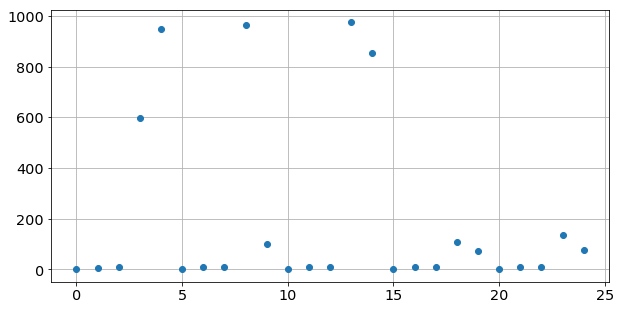

In [72]:
plt.figure(figsize=(10,5))
plt.plot(ratio_of_maxamplitudes,'o')
plt.grid()

In [73]:
print all_filt

['Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400']


## Example of a single spectrum

In [74]:
sel=0
spectrum_sel=thecorrspectra[sel]

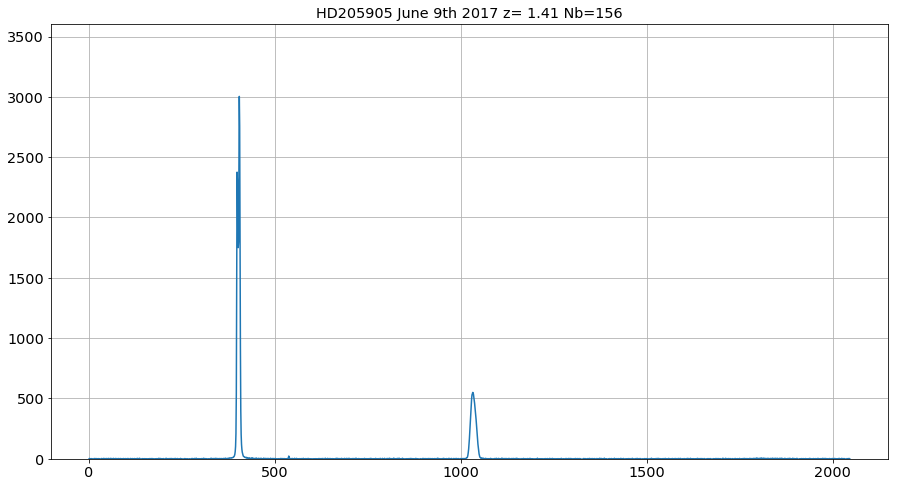

In [75]:
plt.figure(figsize=(15,8))
plt.plot(spectrum_sel)
title=all_titles[sel]
plt.title(title)
plt.grid(True)
plt.ylim(0,spectrum_sel[:1900].max()*1.2)
figfilename=os.path.join(dir_top_images,'singlespec_sample.pdf')
plt.savefig(figfilename) 

# Grating characterisation

Ajuster les paramètres ici pour supprimer les lignes blanches, étoiles proches, etc... mais aussi faire converger  le fit pour le maximum de spectres.

In [76]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os
from tools import *

def EmissionLineFit(spectra,left_edge=1200,right_edge=1600,guess=[10,1400,200],bounds=(-np.inf,np.inf)):
    xs = np.arange(left_edge,right_edge,1)
    right_spectrum = spectra[left_edge:right_edge]
    popt, pcov = fit_gauss(xs,right_spectrum,guess=guess)
    return(popt, pcov)
    

def ShowRightSpectrumProfileFit(spectra,thex0,all_titles,object_name,dir_top_images,all_filt):
    """
    ShowRightSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    NBIMGPERROW=2
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/NBIMGPERROW)+1
    #MaxY= [150.,150.,150.,5000.,1500.,1000.,5000.,5000.,500.,150.]
    
    
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,5*MAXIMGROW))
    f.tight_layout()
    for index in np.arange(0,NBSPEC):
        
        left_edge = thex0[index]+600
        right_edge = min(thex0[index]+700,spectra[index].shape[0]-3)
        xs = np.arange(left_edge,right_edge,1)
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        
        if index % 5 == 4 : continue
        
        popt, pcov = EmissionLineFit(spectra[index],left_edge,right_edge,guess=[500,0.5*(left_edge+right_edge),30])
        
        right_spectrum = spectra[index][left_edge:right_edge]
        axarr[iy,ix].plot(xs,right_spectrum,'r-',lw=2)
        axarr[iy,ix].plot(xs,gauss(xs,*popt),'b-')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,right_spectrum.max()*1.2)
        axarr[iy,ix].set_xlim(left_edge,right_edge)
        axarr[iy,ix].text(0.5*(right_edge+left_edge),right_spectrum.max()*1.1, all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
    
    title='Spectrum 1D profile and background Up/Down for {}'.format(object_name)
    plt.suptitle(title,size=16)
    
    figfilename=os.path.join(dir_top_images,'correctedspectrum_profile2.pdf')
    plt.savefig(figfilename)  
    

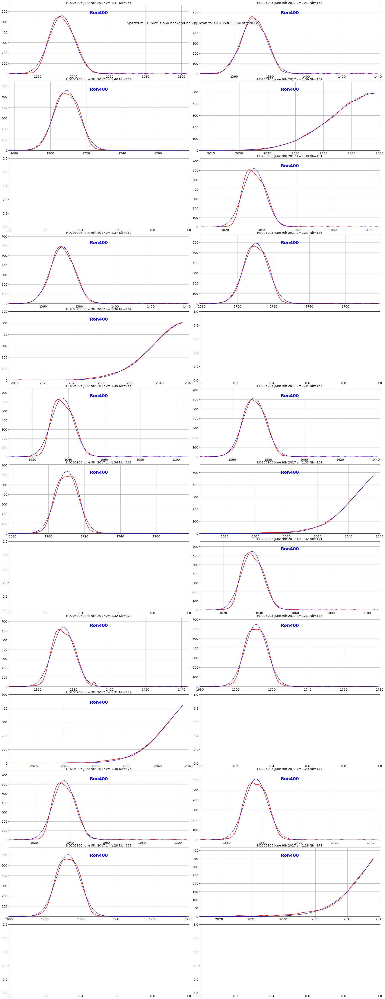

In [77]:
ShowRightSpectrumProfileFit(thecorrspectra,thex0,all_titles,object_name,dir_top_images,all_filt)

In [78]:
def ShowLeftSpectrumProfileFit(spectra,thex0,all_titles,object_name,dir_top_images,all_filt):
    """
    ShowLeftSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    NBIMGPERROW=2
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/NBIMGPERROW)+1
    #MaxY= [150.,150.,150.,5000.,1500.,1000.,5000.,5000.,500.,150.]
    
    
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,5*MAXIMGROW))
    f.tight_layout()
    for index in np.arange(0,NBSPEC):
        
        if index % 5 == 0 : continue

        left_edge = max(0,thex0[index]-800)
        right_edge = thex0[index]-500
        xs = np.arange(left_edge,right_edge,1)
    
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        
        popt, pcov = EmissionLineFit(spectra[index],left_edge,right_edge,guess=[500,0.5*(left_edge+right_edge),30])
        
        left_spectrum = spectra[index][left_edge:right_edge]
        axarr[iy,ix].plot(xs,left_spectrum,'r-',lw=2)
        axarr[iy,ix].plot(xs,gauss(xs,*popt),'b-')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,left_spectrum.max()*1.2)
        axarr[iy,ix].set_xlim(left_edge,right_edge)
        axarr[iy,ix].text(0.5*(right_edge+left_edge),left_spectrum.max()*1.1, all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
    
    title='Spectrum 1D profile and background Up/Down for {}'.format(object_name)
    plt.suptitle(title,size=16)
    
    figfilename=os.path.join(dir_top_images,'correctedspectrum_profile2.pdf')
    plt.savefig(figfilename)  


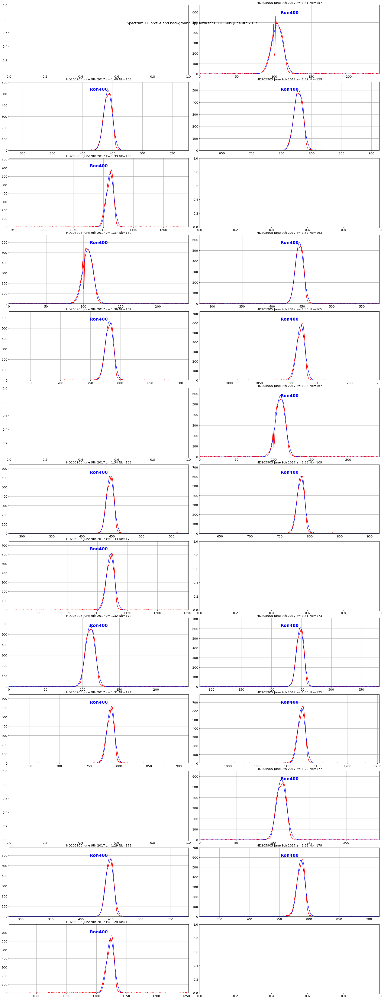

In [79]:
ShowLeftSpectrumProfileFit(thecorrspectra,thex0,all_titles,object_name,dir_top_images,all_filt)

### Distance to CCD estimation using Ron400 and Thor300

Ici il faut reporter les nombres optimaux pour que les fits convergent (left et right edges, guess)

In [80]:
%autoreload 2
from holo_specs import *

def CalibrateDistance2CCD_RightOrder(thecorrspectra,thex0,all_filt,left_edge=1200,right_edge=1600,guess=[10,1400,200],bounds=(-np.inf,np.inf)):

    NBIMGPERROW=2
    NBSPEC=len(thecorrspectra)
    MAXIMGROW=int(NBSPEC/NBIMGPERROW)+1
    #MaxY= [150.,150.,150.,5000.,1500.,1000.,5000.,5000.,500.,150.]
    
    
    f, axarr = plt.subplots(NBSPEC,2,figsize=(25,5*MAXIMGROW))
    #f.tight_layout()
    #f, axarr = plt.subplots(2,2,figsize=(25,10))
    count = 0
    D_range = 2 # in mm
    print 'Present distance to CCD : %.2f mm (to update if necessary)' % DISTANCE2CCD
    print '-------------------------------'    
    distances = []
    distances_err = []
    for index in range(len(thecorrspectra)):
        if index % 5 == 4: 
            count += 1
            continue
        if all_filt[index] != "Ron400" and all_filt[index] != "Thor300" : continue
        if all_filt[index] == "Thor300" : N_theo = 300
        if all_filt[index] == "Ron400"  : N_theo = 400  
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        # dispersion axis analysis
        spectra = thecorrspectra[index]
        left_edge = thex0[index]+600
        right_edge = min(thex0[index]+700,spectra.shape[0]-3)
        guess = [500,0.5*(left_edge+right_edge),30]
        popt, pcov = EmissionLineFit(spectra,left_edge,right_edge,guess,bounds)
        x0 = popt[1]
        x0_err = np.sqrt(pcov[1][1]) 
        deltaX = np.abs(x0 - thex0[index])
        print all_filt[index], ' pointing #%d' % index
        print 'Position of the H-alpha emission line : %.2f +/- %.2f pixels (%.2f percent)' % (deltaX,x0_err,x0_err/deltaX*100)
        Ds = np.linspace(DISTANCE2CCD-D_range,DISTANCE2CCD+D_range,100)
        Ns = []
        diffs = []
        optimal_D = DISTANCE2CCD
        optimal_D_inf = DISTANCE2CCD
        optimal_D_sup = DISTANCE2CCD
        test = 1e20
        test_sup = 1e20
        test_inf = 1e20
        for D in Ds :
            theta = np.arctan2(deltaX*PIXEL2MM,D)
            N = np.sin(theta)/HALPHA_CENTER
            Ns.append( N )
            diff = np.abs(N-N_theo)
            diff_sup = np.abs(N-N_theo+1)
            diff_inf = np.abs(N-N_theo-1)
            diffs.append(diff)
            if diff < test :
                test = diff
                optimal_D = D
            if diff_sup < test_sup :
                test_sup = diff_sup
                optimal_D_sup = D
            if diff_inf < test_inf :
                test_inf = diff_inf
                optimal_D_inf = D
        optimal_D_err  = 0.5*(optimal_D_sup-optimal_D_inf)
        distances.append(optimal_D)
        distances_err.append(optimal_D_err)
        print 'Deduced distance to CCD with %s : %.2f +/- %.2f mm (%.2f percent)' % (all_filt[index],optimal_D,optimal_D_err,100*optimal_D_err/optimal_D)
        # plot Ns vs Ds
        axarr[count,0].plot(Ds,Ns,'b-',lw=2)
        axarr[count,0].plot([np.min(Ds),np.max(Ds)],[N_theo,N_theo],'r-',lw=2)
        axarr[count,0].plot([optimal_D,optimal_D],[np.min(Ns),np.max(Ns)],'r-',lw=2)
        axarr[count,0].plot([np.min(Ds),np.max(Ds)],[N_theo+1,N_theo+1],'k--',lw=2)
        axarr[count,0].plot([np.min(Ds),np.max(Ds)],[N_theo-1,N_theo-1],'k--',lw=2)
        axarr[count,0].plot([optimal_D_inf,optimal_D_inf],[np.min(Ns),np.max(Ns)],'k--',lw=2)
        axarr[count,0].plot([optimal_D_sup,optimal_D_sup],[np.min(Ns),np.max(Ns)],'k--',lw=2)
        axarr[count,0].fill_between([optimal_D_inf,optimal_D_sup],[np.min(Ns),np.min(Ns)],[np.max(Ns),np.max(Ns)],color='red',alpha=0.2)
        axarr[count,0].plot([np.min(Ds),np.max(Ds)],[N_theo-1,N_theo-1],'k--',lw=2)
        axarr[count,0].fill_between([np.min(Ds),np.max(Ds)],[N_theo-1,N_theo-1],[N_theo+1,N_theo+1],color='red',alpha=0.2)
        axarr[count,0].scatter([optimal_D],[N_theo],s=200,color='r')
        axarr[count,0].set_xlim([np.min(Ds),np.max(Ds)])
        axarr[count,0].set_ylim([np.min(Ns),np.max(Ns)])
        axarr[count,0].grid(True)
        #axarr[count,0].text(DISTANCE2CCD+0.6*D_range,N_theo+2.3,all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
        axarr[count,0].set_xlabel('Distance to CCD [mm]',fontsize=16)
        axarr[count,0].set_ylabel('Grooves per mm',fontsize=16)
        # plot diffs vs Ds
        axarr[count,1].plot(Ds,diffs,'b-',lw=2)
        axarr[count,1].plot([optimal_D,optimal_D],[np.min(diffs),np.max(diffs)],'r-',lw=2)
        axarr[count,1].plot([np.min(Ds),np.max(Ds)],[1,1],'k--',lw=2)
        #axarr[count,1].scatter([N_theo],[optimal_D],s=200,color='r')
        axarr[count,1].set_xlim([np.min(Ds),np.max(Ds)])
        axarr[count,1].set_ylim([np.min(diffs),np.max(diffs)])
        axarr[count,1].grid(True)
        axarr[count,1].set_xlabel('Distance to CCD [mm]',fontsize=16)
        axarr[count,1].set_ylabel('Difference to $N_{\mathrm{theo}}$ [grooves per mm]',fontsize=16)
        axarr[count,1].plot([optimal_D_inf,optimal_D_inf],[np.min(diffs),np.max(diffs)],'k--',lw=2)
        axarr[count,1].plot([optimal_D_sup,optimal_D_sup],[np.min(diffs),np.max(diffs)],'k--',lw=2)
        axarr[count,1].fill_between([optimal_D_inf,optimal_D_sup],[np.min(diffs),np.min(diffs)],[np.max(diffs),np.max(diffs)],color='red',alpha=0.2)
        #axarr[count,1].text(DISTANCE2CCD+0.6*D_range,2.5,all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
        count += 1
        print '-------------------------------'  
    distances_mean = np.mean(distances)
    distances_mean_err = np.sqrt(np.mean(np.array(distances_err)**2))
    print 'Average distance to CCD : %.2f +/- %.2f mm (%.2f percent)' % (distances_mean,distances_mean_err,100*distances_mean_err/distances_mean)

    plt.show()
    return(distances_mean,distances_mean_err)

Present distance to CCD : 55.56 mm (to update if necessary)
-------------------------------
Ron400  pointing #0
Position of the H-alpha emission line : 629.36 +/- 0.07 pixels (0.01 percent)
Deduced distance to CCD with Ron400 : 55.54 +/- 0.14 mm (0.25 percent)
-------------------------------
Ron400  pointing #1
Position of the H-alpha emission line : 630.08 +/- 0.05 pixels (0.01 percent)
Deduced distance to CCD with Ron400 : 55.62 +/- 0.16 mm (0.29 percent)
-------------------------------
Ron400  pointing #2
Position of the H-alpha emission line : 632.08 +/- 0.07 pixels (0.01 percent)
Deduced distance to CCD with Ron400 : 55.78 +/- 0.14 mm (0.25 percent)
-------------------------------
Ron400  pointing #3
Position of the H-alpha emission line : 631.49 +/- 0.20 pixels (0.03 percent)
Deduced distance to CCD with Ron400 : 55.74 +/- 0.16 mm (0.29 percent)
-------------------------------
Ron400  pointing #5
Position of the H-alpha emission line : 630.12 +/- 0.11 pixels (0.02 percent)
Deduce

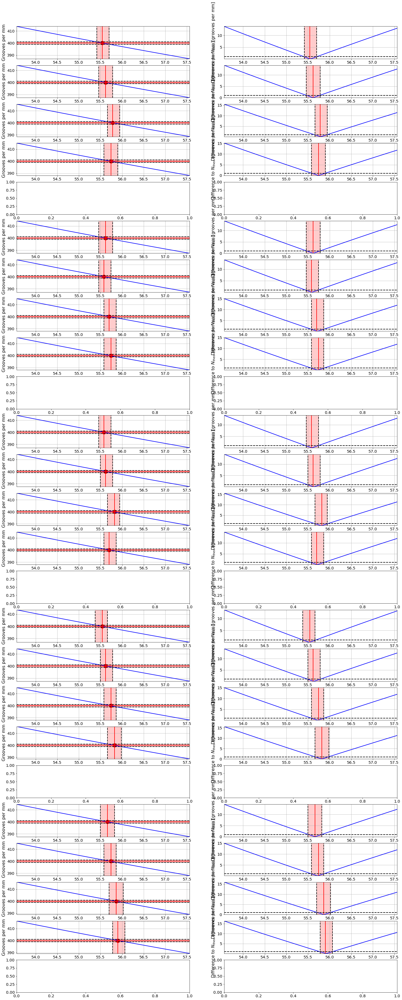

-------------------------------
Average distance to CCD : 55.70 +/- 0.15 mm (0.27 percent)


In [81]:
left_edge = 1200
right_edge = 1600
guess = [10,1400,200]
distance_rightorder, distance_rightorder_err = CalibrateDistance2CCD_RightOrder(thecorrspectra,thex0,all_filt,left_edge,right_edge,guess)

print '-------------------------------'  
distance_mean = np.mean(distance_rightorder)
distance_mean_err = np.sqrt(np.mean(np.array(distance_rightorder_err)**2))
print 'Average distance to CCD : %.2f +/- %.2f mm (%.2f percent)' % (distance_mean,distance_mean_err,100*distance_mean_err/distance_mean)

In [82]:
%autoreload 2
from holo_specs import *

def CalibrateDistance2CCD_LeftOrder(thecorrspectra,thex0,all_filt,left_edge=1200,right_edge=1600,guess=[10,1400,200],bounds=(-np.inf,np.inf)):

    NBIMGPERROW=2
    NBSPEC=len(thecorrspectra)
    MAXIMGROW=int(NBSPEC/NBIMGPERROW)+1
    #MaxY= [150.,150.,150.,5000.,1500.,1000.,5000.,5000.,500.,150.]
    
    
    f, axarr = plt.subplots(NBSPEC,2,figsize=(25,5*MAXIMGROW))
    #f.tight_layout()
    #f, axarr = plt.subplots(2,2,figsize=(25,10))
    count = 0
    D_range = 2 # in mm
    print 'Present distance to CCD : %.2f mm (to update if necessary)' % DISTANCE2CCD
    print '-------------------------------'    
    distances = []
    distances_err = []
    for index in range(len(thecorrspectra)):
        if index % 5 == 0: 
            count += 1
            continue
        if all_filt[index] != "Ron400" and all_filt[index] != "Thor300" : continue
        if all_filt[index] == "Thor300" : N_theo = 300
        if all_filt[index] == "Ron400"  : N_theo = 400  
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        # dispersion axis analysis
        spectra = thecorrspectra[index]
        left_edge = max(0,thex0[index]-800)
        right_edge = thex0[index]-500
        guess = [500,0.5*(left_edge+right_edge),30]
        popt, pcov = EmissionLineFit(spectra,left_edge,right_edge,guess,bounds)
        x0 = popt[1]
        x0_err = np.sqrt(pcov[1][1]) 
        deltaX = np.abs(x0 - thex0[index])
        print all_filt[index], ' pointing #%d' % index
        print 'Position of the H-alpha emission line : %.2f +/- %.2f pixels (%.2f percent)' % (deltaX,x0_err,x0_err/deltaX*100)
        Ds = np.linspace(DISTANCE2CCD-D_range,DISTANCE2CCD+D_range,100)
        Ns = []
        diffs = []
        optimal_D = DISTANCE2CCD
        optimal_D_inf = DISTANCE2CCD
        optimal_D_sup = DISTANCE2CCD
        test = 1e20
        test_sup = 1e20
        test_inf = 1e20
        for D in Ds :
            theta = np.arctan2(deltaX*PIXEL2MM,D)
            N = np.sin(theta)/HALPHA_CENTER
            Ns.append( N )
            diff = np.abs(N-N_theo)
            diff_sup = np.abs(N-N_theo+1)
            diff_inf = np.abs(N-N_theo-1)
            diffs.append(diff)
            if diff < test :
                test = diff
                optimal_D = D
            if diff_sup < test_sup :
                test_sup = diff_sup
                optimal_D_sup = D
            if diff_inf < test_inf :
                test_inf = diff_inf
                optimal_D_inf = D
        optimal_D_err  = 0.5*(optimal_D_sup-optimal_D_inf)
        distances.append(optimal_D)
        distances_err.append(optimal_D_err)
        print 'Deduced distance to CCD with %s : %.2f +/- %.2f mm (%.2f percent)' % (all_filt[index],optimal_D,optimal_D_err,100*optimal_D_err/optimal_D)
        # plot Ns vs Ds
        axarr[count,0].plot(Ds,Ns,'b-',lw=2)
        axarr[count,0].plot([np.min(Ds),np.max(Ds)],[N_theo,N_theo],'r-',lw=2)
        axarr[count,0].plot([optimal_D,optimal_D],[np.min(Ns),np.max(Ns)],'r-',lw=2)
        axarr[count,0].plot([np.min(Ds),np.max(Ds)],[N_theo+1,N_theo+1],'k--',lw=2)
        axarr[count,0].plot([np.min(Ds),np.max(Ds)],[N_theo-1,N_theo-1],'k--',lw=2)
        axarr[count,0].plot([optimal_D_inf,optimal_D_inf],[np.min(Ns),np.max(Ns)],'k--',lw=2)
        axarr[count,0].plot([optimal_D_sup,optimal_D_sup],[np.min(Ns),np.max(Ns)],'k--',lw=2)
        axarr[count,0].fill_between([optimal_D_inf,optimal_D_sup],[np.min(Ns),np.min(Ns)],[np.max(Ns),np.max(Ns)],color='red',alpha=0.2)
        axarr[count,0].plot([np.min(Ds),np.max(Ds)],[N_theo-1,N_theo-1],'k--',lw=2)
        axarr[count,0].fill_between([np.min(Ds),np.max(Ds)],[N_theo-1,N_theo-1],[N_theo+1,N_theo+1],color='red',alpha=0.2)
        axarr[count,0].scatter([optimal_D],[N_theo],s=200,color='r')
        axarr[count,0].set_xlim([np.min(Ds),np.max(Ds)])
        axarr[count,0].set_ylim([np.min(Ns),np.max(Ns)])
        axarr[count,0].grid(True)
        #axarr[count,0].text(DISTANCE2CCD+0.6*D_range,N_theo+2.3,all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
        axarr[count,0].set_xlabel('Distance to CCD [mm]',fontsize=16)
        axarr[count,0].set_ylabel('Grooves per mm',fontsize=16)
        # plot diffs vs Ds
        axarr[count,1].plot(Ds,diffs,'b-',lw=2)
        axarr[count,1].plot([optimal_D,optimal_D],[np.min(diffs),np.max(diffs)],'r-',lw=2)
        axarr[count,1].plot([np.min(Ds),np.max(Ds)],[1,1],'k--',lw=2)
        #axarr[count,1].scatter([N_theo],[optimal_D],s=200,color='r')
        axarr[count,1].set_xlim([np.min(Ds),np.max(Ds)])
        axarr[count,1].set_ylim([np.min(diffs),np.max(diffs)])
        axarr[count,1].grid(True)
        axarr[count,1].set_xlabel('Distance to CCD [mm]',fontsize=16)
        axarr[count,1].set_ylabel('Difference to $N_{\mathrm{theo}}$ [grooves per mm]',fontsize=16)
        axarr[count,1].plot([optimal_D_inf,optimal_D_inf],[np.min(diffs),np.max(diffs)],'k--',lw=2)
        axarr[count,1].plot([optimal_D_sup,optimal_D_sup],[np.min(diffs),np.max(diffs)],'k--',lw=2)
        axarr[count,1].fill_between([optimal_D_inf,optimal_D_sup],[np.min(diffs),np.min(diffs)],[np.max(diffs),np.max(diffs)],color='red',alpha=0.2)
        #axarr[count,1].text(DISTANCE2CCD+0.6*D_range,2.5,all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
        count += 1
        print '-------------------------------'  
    distances_mean = np.mean(distances)
    distances_mean_err = np.sqrt(np.mean(np.array(distances_err)**2))
    print 'Average distance to CCD : %.2f +/- %.2f mm (%.2f percent)' % (distances_mean,distances_mean_err,100*distances_mean_err/distances_mean)

    plt.show()
    return(distances_mean,distances_mean_err)

Present distance to CCD : 55.56 mm (to update if necessary)
-------------------------------
Ron400  pointing #1
Position of the H-alpha emission line : 636.65 +/- 0.16 pixels (0.02 percent)
Deduced distance to CCD with Ron400 : 56.19 +/- 0.14 mm (0.25 percent)
-------------------------------
Ron400  pointing #2
Position of the H-alpha emission line : 634.40 +/- 0.06 pixels (0.01 percent)
Deduced distance to CCD with Ron400 : 55.98 +/- 0.14 mm (0.25 percent)
-------------------------------
Ron400  pointing #3
Position of the H-alpha emission line : 634.92 +/- 0.06 pixels (0.01 percent)
Deduced distance to CCD with Ron400 : 56.07 +/- 0.14 mm (0.25 percent)
-------------------------------
Ron400  pointing #4
Position of the H-alpha emission line : 630.90 +/- 0.08 pixels (0.01 percent)
Deduced distance to CCD with Ron400 : 55.70 +/- 0.14 mm (0.25 percent)
-------------------------------
Ron400  pointing #6
Position of the H-alpha emission line : 634.94 +/- 0.12 pixels (0.02 percent)
Deduce

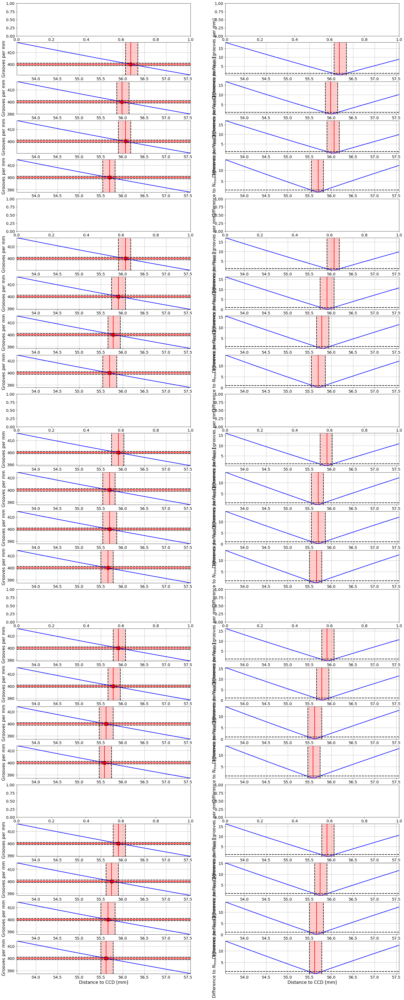

-------------------------------
Average distance to CCD : 55.81 +/- 0.15 mm (0.26 percent)


In [83]:
#left_edge = 1200
#right_edge = 1600
#guess = [10,1400,200]
distance_leftorder, distance_leftorder_err = CalibrateDistance2CCD_LeftOrder(thecorrspectra,thex0,all_filt,left_edge,right_edge,guess)

print '-------------------------------'  
distance_mean = np.mean(distance_leftorder)
distance_mean_err = np.sqrt(np.mean(np.array(distance_leftorder_err)**2))
print 'Average distance to CCD : %.2f +/- %.2f mm (%.2f percent)' % (distance_mean,distance_mean_err,100*distance_mean_err/distance_mean)

The DISTANCE2CCD value shifts in opposite way accross the images if we use the right or left order spectra. It meens that the uncertainty comes from the position of the star center along the x axis. The determinantion with both orders can remove this effect.

In [84]:
%autoreload 2
from holo_specs import *

def CalibrateDistance2CCD_TwoOrder(thecorrspectra,thex0,all_filt,leftorder_edges=[100,400],rightorder_edges=[1200,1600],guess=[[10,200,100],[10,1400,200]],bounds=(-np.inf,np.inf)):

    NBIMGPERROW=2
    NBSPEC=len(thecorrspectra)
    MAXIMGROW=int(NBSPEC/NBIMGPERROW)+1
    #MaxY= [150.,150.,150.,5000.,1500.,1000.,5000.,5000.,500.,150.]
    
    f, axarr = plt.subplots(NBSPEC,2,figsize=(25,5*MAXIMGROW))

    count = 0
    D_range = 1 # in mm
    print 'Present distance to CCD : %.2f mm (to update if necessary)' % DISTANCE2CCD
    print '-------------------------------'    
    distances = []
    distances_err = []
    for index in range(len(thecorrspectra)):
        if all_filt[index] != "Ron400" and all_filt[index] != "Thor300" : continue
        if all_filt[index] == "Thor300" : N_theo = 300
        if all_filt[index] == "Ron400"  : N_theo = 400  
            
        if index % 5 == 4 or index % 5 == 0: 
            distances.append(np.nan)
            distances_err.append(np.nan)
            count += 1
            continue
        # dispersion axis analysis
        spectra = thecorrspectra[index]
        leftorder_edges[0] = max(0,thex0[index]-800)
        leftorder_edges[1] = thex0[index]-500
        guess[0] = [500,0.5*(leftorder_edges[0]+leftorder_edges[1]),30]
        popt, pcov = EmissionLineFit(spectra,leftorder_edges[0],leftorder_edges[1],guess[0],bounds)
        x0_left = popt[1]
        x0_left_err = np.sqrt(pcov[1][1]) 
        rightorder_edges[0] = thex0[index]+600
        rightorder_edges[1] = min(thex0[index]+700,spectra.shape[0]-3)
        guess[1] = [500,0.5*(rightorder_edges[0]+rightorder_edges[1]),30]
        popt, pcov = EmissionLineFit(spectra,rightorder_edges[0],rightorder_edges[1],guess[1],bounds)
        x0_right = popt[1]
        x0_right_err = np.sqrt(pcov[1][1]) 
        deltaX = 0.5*np.abs(x0_right - x0_left)
        x0_err = 0.5*np.sqrt(x0_right_err**2+x0_left_err**2)
        print all_filt[index], ' pointing #%d' % index
        print 'Position of the H-alpha emission line : %.2f +/- %.2f pixels (%.2f percent)' % (deltaX,x0_err,x0_err/deltaX*100)
        Ds = np.linspace(DISTANCE2CCD-D_range,DISTANCE2CCD+D_range,100)
        Ns = []
        diffs = []
        optimal_D = DISTANCE2CCD
        optimal_D_inf = DISTANCE2CCD
        optimal_D_sup = DISTANCE2CCD
        test = 1e20
        test_sup = 1e20
        test_inf = 1e20
        for D in Ds :
            theta = np.arctan2(deltaX*PIXEL2MM,D)
            N = np.sin(theta)/HALPHA_CENTER
            Ns.append( N )
            diff = np.abs(N-N_theo)
            diff_sup = np.abs(N-N_theo+1)
            diff_inf = np.abs(N-N_theo-1)
            diffs.append(diff)
            if diff < test :
                test = diff
                optimal_D = D
            if diff_sup < test_sup :
                test_sup = diff_sup
                optimal_D_sup = D
            if diff_inf < test_inf :
                test_inf = diff_inf
                optimal_D_inf = D
        optimal_D_err  = 0.5*(optimal_D_sup-optimal_D_inf)
        distances.append(optimal_D)
        distances_err.append(optimal_D_err)
        print 'Deduced distance to CCD with %s : %.2f +/- %.2f mm (%.2f percent)' % (all_filt[index],optimal_D,optimal_D_err,100*optimal_D_err/optimal_D)
        # plot Ns vs Ds
        axarr[count,0].plot(Ds,Ns,'b-',lw=2)
        axarr[count,0].plot([np.min(Ds),np.max(Ds)],[N_theo,N_theo],'r-',lw=2)
        axarr[count,0].plot([optimal_D,optimal_D],[np.min(Ns),np.max(Ns)],'r-',lw=2)
        axarr[count,0].plot([np.min(Ds),np.max(Ds)],[N_theo+1,N_theo+1],'k--',lw=2)
        axarr[count,0].plot([np.min(Ds),np.max(Ds)],[N_theo-1,N_theo-1],'k--',lw=2)
        axarr[count,0].plot([optimal_D_inf,optimal_D_inf],[np.min(Ns),np.max(Ns)],'k--',lw=2)
        axarr[count,0].plot([optimal_D_sup,optimal_D_sup],[np.min(Ns),np.max(Ns)],'k--',lw=2)
        axarr[count,0].fill_between([optimal_D_inf,optimal_D_sup],[np.min(Ns),np.min(Ns)],[np.max(Ns),np.max(Ns)],color='red',alpha=0.2)
        axarr[count,0].plot([np.min(Ds),np.max(Ds)],[N_theo-1,N_theo-1],'k--',lw=2)
        axarr[count,0].fill_between([np.min(Ds),np.max(Ds)],[N_theo-1,N_theo-1],[N_theo+1,N_theo+1],color='red',alpha=0.2)
        axarr[count,0].scatter([optimal_D],[N_theo],s=200,color='r')
        axarr[count,0].set_xlim([np.min(Ds),np.max(Ds)])
        axarr[count,0].set_ylim([np.min(Ns),np.max(Ns)])
        axarr[count,0].grid(True)
        axarr[count,0].text(DISTANCE2CCD+0.6*D_range,N_theo+2.3,all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
        axarr[count,0].set_xlabel('Distance to CCD [mm]',fontsize=16)
        axarr[count,0].set_ylabel('Grooves per mm',fontsize=16)
        # plot diffs vs Ds
        axarr[count,1].plot(Ds,diffs,'b-',lw=2)
        axarr[count,1].plot([optimal_D,optimal_D],[np.min(diffs),np.max(diffs)],'r-',lw=2)
        axarr[count,1].plot([np.min(Ds),np.max(Ds)],[1,1],'k--',lw=2)
        #axarr[count,1].scatter([N_theo],[optimal_D],s=200,color='r')
        axarr[count,1].set_xlim([np.min(Ds),np.max(Ds)])
        axarr[count,1].set_ylim([np.min(diffs),np.max(diffs)])
        axarr[count,1].grid(True)
        axarr[count,1].set_xlabel('Distance to CCD [mm]',fontsize=16)
        axarr[count,1].set_ylabel('Difference to $N_{\mathrm{theo}}$ [grooves per mm]',fontsize=16)
        axarr[count,1].plot([optimal_D_inf,optimal_D_inf],[np.min(diffs),np.max(diffs)],'k--',lw=2)
        axarr[count,1].plot([optimal_D_sup,optimal_D_sup],[np.min(diffs),np.max(diffs)],'k--',lw=2)
        axarr[count,1].fill_between([optimal_D_inf,optimal_D_sup],[np.min(diffs),np.min(diffs)],[np.max(diffs),np.max(diffs)],color='red',alpha=0.2)
        axarr[count,1].text(DISTANCE2CCD+0.6*D_range,2,all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
        count += 1
        print '-------------------------------'  
    d = []
    d_errs = []
    for k in range(len(distances)):
        if np.isnan(distances[k]): continue
        d.append(distances[k])
        d_errs.append(distances_err[k])
    distances_mean = np.mean(d)
    distances_mean_err = np.sqrt(np.mean(np.array(d_errs)**2))
    print 'Average distance to CCD : %.2f +/- %.2f mm (%.2f percent)' % (distances_mean,distances_mean_err,100*distances_mean_err/distances_mean)

    plt.show()
    return(distances_mean,distances_mean_err, distances)

Present distance to CCD : 55.56 mm (to update if necessary)
-------------------------------
Ron400  pointing #1
Position of the H-alpha emission line : 633.37 +/- 0.08 pixels (0.01 percent)
Deduced distance to CCD with Ron400 : 55.91 +/- 0.15 mm (0.27 percent)
-------------------------------
Ron400  pointing #2
Position of the H-alpha emission line : 633.24 +/- 0.04 pixels (0.01 percent)
Deduced distance to CCD with Ron400 : 55.89 +/- 0.15 mm (0.27 percent)
-------------------------------
Ron400  pointing #3
Position of the H-alpha emission line : 633.20 +/- 0.10 pixels (0.02 percent)
Deduced distance to CCD with Ron400 : 55.89 +/- 0.15 mm (0.27 percent)
-------------------------------
Ron400  pointing #6
Position of the H-alpha emission line : 632.35 +/- 0.07 pixels (0.01 percent)
Deduced distance to CCD with Ron400 : 55.81 +/- 0.15 mm (0.27 percent)
-------------------------------
Ron400  pointing #7
Position of the H-alpha emission line : 632.28 +/- 0.04 pixels (0.01 percent)
Deduce

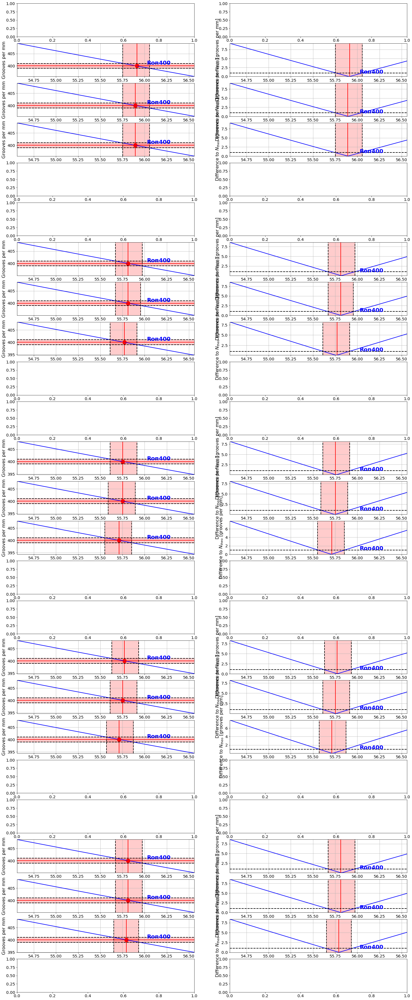

In [85]:
distance_mean, distance_mean_err, distances = CalibrateDistance2CCD_TwoOrder(thecorrspectra,thex0,all_filt,leftorder_edges=[100,400],rightorder_edges=[1200,1600],guess=[[10,200,200],[10,1400,200]],bounds=(-np.inf,np.inf))

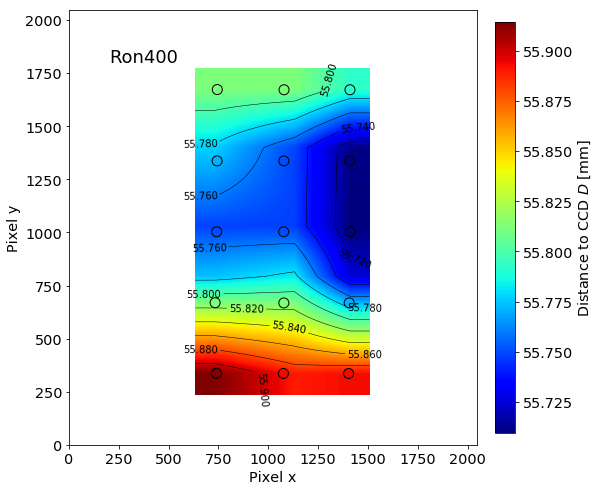

In [86]:
margin = 100

y = []
x = []
d = []
for k in range(len(distances)):
    if np.isnan(distances[k]) : continue
    y.append((central_positions.T)[0][k])
    x.append((central_positions.T)[1][k])
    d.append(distances[k])
xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,d,margin=margin,kind='linear')

fig = plt.figure(figsize=(8,8))
plt.scatter(x, y, c=d, s=100, cmap=cm.jet, marker='o', vmin=np.min(d), vmax=np.max(d),edgecolors='k')
im = plt.imshow(z, extent=[np.min(x)-margin, np.max(x)+margin, np.min(y)-margin, np.max(y)+margin],origin='lower',aspect='auto',cmap=cm.jet)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.text(200,1800,holo_name,fontsize=18)
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])

#xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,d,margin=margin)
CS = plt.contour(xx,yy,z,10,linewidths=0.5,colors='k')
plt.clabel(CS, inline=1, fontsize=10)

cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
#cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Distance to CCD $D$ [mm]') #,fontsize=16)

plt.show()

### Resolution of the gratings

With the +1 order

In [87]:
%autoreload 2
from holo_specs import *

def GratingResolution_RightOrder(thecorrspectra,thex0,all_images,all_filt,left_edge=1200,right_edge=1600,guess=[10,1400,200],bounds=(-np.inf,np.inf)):
    print 'H-alpha filter center: %.1fnm ' % (HALPHA_CENTER*1e6)
    print 'H-alpha filter width: %.1fnm\n' % (HALPHA_WIDTH*1e6)

    Ns = []
    N_errs = []
    for index in range(len(thecorrspectra)):
        if index % 5 == 4:  continue

        # dispersion axis analysis
        spectra = thecorrspectra[index]
        left_edge = thex0[index]+600
        right_edge = min(thex0[index]+700,spectra.shape[0]-3)
        guess = [500,0.5*(left_edge+right_edge),30]
        popt, pcov = EmissionLineFit(spectra,left_edge,right_edge,guess,bounds)
        x0 = popt[1]
        # compute N
        deltaX = np.abs(x0 - thex0[index])
        theta = np.arctan2(deltaX*PIXEL2MM,DISTANCE2CCD)
        N = np.sin(theta)/HALPHA_CENTER
        Ns.append(N)
        # compute N uncertainty 
        theta = np.arctan2(deltaX*PIXEL2MM,DISTANCE2CCD+DISTANCE2CCD_ERR)
        N_up = np.sin(theta)/HALPHA_CENTER
        theta = np.arctan2(deltaX*PIXEL2MM,DISTANCE2CCD-DISTANCE2CCD_ERR)
        N_low = np.sin(theta)/HALPHA_CENTER
        N_err = 0.5*np.abs(N_up-N_low)
        N_errs.append(N_err)
        # look at finesse
        fwhm_line = np.abs(popt[2])*2.355
        g = Grating(N,label=all_filt[index])
        res = g.grating_resolution(deltaX)
        finesse = HALPHA_CENTER/(res*fwhm_line*1e-6-HALPHA_WIDTH)
        print all_filt[index],' pointing #%d' %index
        print 'N=%.1f +/- %.1f lines/mm\t H-alpha FWHM=%.1fpix with res=%.3fnm/pix : FWHM=%.1fnm\t ie finesse=%.1f' % (N,N_err,fwhm_line,res,res*fwhm_line,finesse)
        # transverse profile analysis
        if int(x0) < all_images[index].shape[1] :
            yprofile=np.copy(all_images[index])[:,int(x0)]
            popt2, pcov2 = EmissionLineFit(yprofile,0,len(yprofile),[500,100,10])
            fwhm_profile = np.abs(popt2[2])*2.355
            finesse_profile = HALPHA_CENTER*1e6/(res*fwhm_profile)
            print 'Transverse profile FWHM=%.1fpix ' % (fwhm_profile)
        else :
            print 'Transverse profile undetermined '        
        print '-------------------------------'
    return(Ns,N_errs)

In [88]:
#left_edge = 1200
#right_edge = 1600
#guess = [10,1400,200]
N_rightorder, N_rightorder_err = GratingResolution_RightOrder(thecorrspectra,thex0,all_images,all_filt,left_edge,right_edge,guess)

H-alpha filter center: 655.9nm 
H-alpha filter width: 6.4nm

Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.3 degrees
Ron400  pointing #0
N=400.0 +/- 1.1 lines/mm	 H-alpha FWHM=16.4pix with res=nannm/pix : FWHM=nannm	 ie finesse=nan
Transverse profile FWHM=5.5pix 
-------------------------------
Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.3 degrees
Ron400  pointing #1
N=400.4 +/- 1.1 lines/mm	 H-alpha FWHM=16.8pix with res=nannm/pix : FWHM=nannm	 ie finesse=nan
Transverse profile FWHM=5.5pix 
-------------------------------
Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.3 degrees
Ron400  pointing #2
N=401.6 +/- 1.1 lines/mm	 H-alpha FWHM=16.8pix with res=nannm/pix : FWHM=nannm	 ie finesse=nan
Transverse profile FWHM=5.5pix 
-------------------------------
Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.3 degrees
Ron400  pointing #3
N=401.2 +/- 1.1 lines/mm	 H-alpha FWHM

With -1 order

In [89]:
%autoreload 2
from holo_specs import *

def GratingResolution_LeftOrder(thecorrspectra,thex0,all_images,all_filt,left_edge=1200,right_edge=1600,guess=[10,1400,200],bounds=(-np.inf,np.inf)):
    print 'H-alpha filter center: %.1fnm ' % (HALPHA_CENTER*1e6)
    print 'H-alpha filter width: %.1fnm\n' % (HALPHA_WIDTH*1e6)

    Ns = []
    N_errs = []
    for index in range(len(thecorrspectra)):
        if index % 5 == 0:  continue

        # dispersion axis analysis
        spectra = thecorrspectra[index]
        left_edge = max(0,thex0[index]-800)
        right_edge = thex0[index]-500
        guess = [500,0.5*(left_edge+right_edge),30]
        popt, pcov = EmissionLineFit(spectra,left_edge,right_edge,guess,bounds)
        x0 = popt[1]
        # compute N
        deltaX = np.abs(x0 - thex0[index])
        theta = np.arctan2(deltaX*PIXEL2MM,DISTANCE2CCD)
        N = np.sin(theta)/HALPHA_CENTER
        Ns.append(N)
        # compute N uncertainty 
        theta = np.arctan2(deltaX*PIXEL2MM,DISTANCE2CCD+DISTANCE2CCD_ERR)
        N_up = np.sin(theta)/HALPHA_CENTER
        theta = np.arctan2(deltaX*PIXEL2MM,DISTANCE2CCD-DISTANCE2CCD_ERR)
        N_low = np.sin(theta)/HALPHA_CENTER
        N_err = 0.5*np.abs(N_up-N_low)
        N_errs.append(N_err)
        # look at finesse
        fwhm_line = np.abs(popt[2])*2.355
        g = Grating(N,label=all_filt[index])
        res = g.grating_resolution(deltaX)
        finesse = HALPHA_CENTER/(res*fwhm_line*1e-6-HALPHA_WIDTH)
        print all_filt[index],' pointing #%d' %index
        print 'N=%.1f +/- %.1f lines/mm\t H-alpha FWHM=%.1fpix with res=%.3fnm/pix : FWHM=%.1fnm\t ie finesse=%.1f' % (N,N_err,fwhm_line,res,res*fwhm_line,finesse)
        # transverse profile analysis
        if int(x0) < all_images[index].shape[1] :
            yprofile=np.copy(all_images[index])[:,int(x0)]
            popt2, pcov2 = EmissionLineFit(yprofile,0,len(yprofile),[500,100,10])
            fwhm_profile = np.abs(popt2[2])*2.355
            finesse_profile = HALPHA_CENTER*1e6/(res*fwhm_profile)
            print 'Transverse profile FWHM=%.1fpix ' % (fwhm_profile)
        else :
            print 'Transverse profile undetermined '        
        print '-------------------------------'
    return(Ns,N_errs)

In [90]:
#left_edge = 100
#right_edge = 400
#guess=[10,200,100]
#bounds=((50,300),(left_edge,right_edge),(1,30))
N_leftorder, N_leftorder_err = GratingResolution_LeftOrder(thecorrspectra,thex0,all_images,all_filt,left_edge,right_edge,guess)

H-alpha filter center: 655.9nm 
H-alpha filter width: 6.4nm

Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.3 degrees
Ron400  pointing #1
N=404.3 +/- 1.2 lines/mm	 H-alpha FWHM=18.1pix with res=nannm/pix : FWHM=nannm	 ie finesse=nan
Transverse profile FWHM=6.0pix 
-------------------------------
Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.3 degrees
Ron400  pointing #2
N=403.0 +/- 1.1 lines/mm	 H-alpha FWHM=16.9pix with res=nannm/pix : FWHM=nannm	 ie finesse=nan
Transverse profile FWHM=5.7pix 
-------------------------------
Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.3 degrees
Ron400  pointing #3
N=403.3 +/- 1.1 lines/mm	 H-alpha FWHM=17.9pix with res=nannm/pix : FWHM=nannm	 ie finesse=nan
Transverse profile FWHM=5.6pix 
-------------------------------
Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.3 degrees
Ron400  pointing #4
N=400.9 +/- 1.1 lines/mm	 H-alpha FWHM

In [91]:
%autoreload 2
from holo_specs import *

def GratingResolution_TwoOrder(thecorrspectra,thex0,all_images,all_filt,leftorder_edges=[100,400],rightorder_edges=[1200,1600],guess=[[10,200,100],[10,1400,200]],bounds=(-np.inf,np.inf)):
    print 'H-alpha filter center: %.1fnm ' % (HALPHA_CENTER*1e6)
    print 'H-alpha filter width: %.1fnm\n' % (HALPHA_WIDTH*1e6)

    Ns = []
    N_errs = []
    for index in range(len(thecorrspectra)):
        if index % 5 == 4 or index % 5 == 0: 
            Ns.append(np.nan)
            N_errs.append(np.nan)
            continue
        # dispersion axis analysis
        spectra = thecorrspectra[index]
        leftorder_edges[0] = max(0,thex0[index]-800)
        leftorder_edges[1] = thex0[index]-500
        guess[0] = [500,0.5*(leftorder_edges[0]+leftorder_edges[1]),30]
        popt, pcov = EmissionLineFit(spectra,leftorder_edges[0],leftorder_edges[1],guess[0],bounds)
        x0_left = popt[1]
        x0_left_err = np.sqrt(pcov[1][1]) 
        rightorder_edges[0] = thex0[index]+600
        rightorder_edges[1] = min(thex0[index]+700,spectra.shape[0]-3)
        guess[1] = [500,0.5*(rightorder_edges[0]+rightorder_edges[1]),30]
        popt2, pcov2 = EmissionLineFit(spectra,rightorder_edges[0],rightorder_edges[1],guess[1],bounds)
        x0_right = popt2[1]
        # compute N
        deltaX = 0.5*np.abs(x0_left - x0_right)
        theta = np.arctan2(deltaX*PIXEL2MM,DISTANCE2CCD)
        N = np.sin(theta)/HALPHA_CENTER
        Ns.append(N)
        # compute N uncertainty 
        theta = np.arctan2(deltaX*PIXEL2MM,DISTANCE2CCD+DISTANCE2CCD_ERR)
        N_up = np.sin(theta)/HALPHA_CENTER
        theta = np.arctan2(deltaX*PIXEL2MM,DISTANCE2CCD-DISTANCE2CCD_ERR)
        N_low = np.sin(theta)/HALPHA_CENTER
        N_err = 0.5*np.abs(N_up-N_low)
        N_errs.append(N_err)
        # look at finesse
        print all_filt[index], ' pointing #%d' % index
        g = Grating(N,label=all_filt[index])
        res = g.grating_resolution(deltaX)
        # right
        fwhm_line_right = np.abs(popt2[2])*2.355
        finesse_right = HALPHA_CENTER/(res*fwhm_line_right*1e-6-HALPHA_WIDTH)
        # left
        fwhm_line_left = np.abs(popt[2])*2.355
        finesse_left = HALPHA_CENTER/(res*fwhm_line_left*1e-6-HALPHA_WIDTH)
        print 'N=%.1f +/- %.1f lines/mm' % (N,N_err)
        print 'Right order: H-alpha FWHM=%.1f pix with res=%.2g nm/pix : FWHM=%.1f nm\t ie finesse=%.1f' % (fwhm_line_right,res,res*fwhm_line_right,finesse_right)
        print 'Left  order: H-alpha FWHM=%.1f pix with res=%.2g nm/pix : FWHM=%.1f nm\t ie finesse=%.1f' % (fwhm_line_left,res,res*fwhm_line_left,finesse_left)
         # transverse profile analysis
        if int(x0_right) < all_images[index].shape[1] :
            # right
            yprofile=np.copy(all_images[index])[:,int(x0_right)]
            popt2, pcov2 = EmissionLineFit(yprofile,0,len(yprofile),[500,100,10])
            fwhm_profile_right = np.abs(popt2[2])*2.355
            finesse_profile_right = HALPHA_CENTER*1e6/(res*fwhm_profile_right)
        else : 
            fwhm_profile_right = np.nan
        if int(x0_left) < 0 :
            # left
            yprofile=np.copy(all_images[index])[:,int(x0_left)]
            popt2, pcov2 = EmissionLineFit(yprofile,0,len(yprofile),[500,100,10])
            fwhm_profile_left = np.abs(popt2[2])*2.355
            finesse_profile_left = HALPHA_CENTER*1e6/(res*fwhm_profile_left)
        else : 
            fwhm_profile_left = np.nan
    
        print 'Transverse profile FWHM :  %.1f pix (right)  %.1f pix (left)' % (fwhm_profile_right, fwhm_profile_left)
        print '-------------------------------'
    return(Ns,N_errs)

In [92]:
Ns, N_errs = GratingResolution_TwoOrder(thecorrspectra,thex0,all_images,all_filt,leftorder_edges=[100,400],rightorder_edges=[1200,1600],guess=[[10,200,100],[10,1400,200]])

H-alpha filter center: 655.9nm 
H-alpha filter width: 6.4nm

Ron400  pointing #1
Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.3 degrees
N=402.3 +/- 1.1 lines/mm
Right order: H-alpha FWHM=16.8 pix with res=nan nm/pix : FWHM=nan nm	 ie finesse=nan
Left  order: H-alpha FWHM=18.1 pix with res=nan nm/pix : FWHM=nan nm	 ie finesse=nan
Transverse profile FWHM :  5.5 pix (right)  nan pix (left)
-------------------------------
Ron400  pointing #2
Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.3 degrees
N=402.3 +/- 1.1 lines/mm
Right order: H-alpha FWHM=16.8 pix with res=nan nm/pix : FWHM=nan nm	 ie finesse=nan
Left  order: H-alpha FWHM=16.9 pix with res=nan nm/pix : FWHM=nan nm	 ie finesse=nan
Transverse profile FWHM :  5.5 pix (right)  nan pix (left)
-------------------------------
Ron400  pointing #3
Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.3 degrees
N=402.2 +/- 1.1 lines/mm
Right order: H-alpha FWH

Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.3 degrees
[  0.00000000e+00   2.40117245e-02   4.80234489e-02 ...,   4.91039766e+01
   4.91279883e+01   4.91520000e+01]
[0 0 0 ..., 0 0 0]


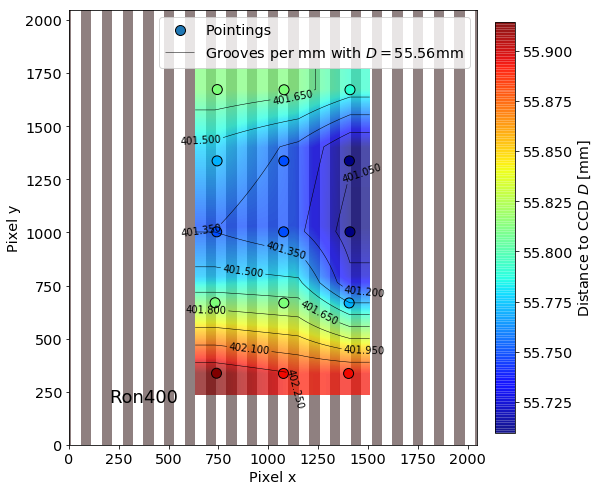

In [107]:
from holo_specs import *

margin = 100

y = []
x = []
d = []
N = []
for k in range(len(distances)):
    if np.isnan(distances[k]) : continue
    y.append((central_positions.T)[0][k])
    x.append((central_positions.T)[1][k])
    d.append(distances[k])
    N.append(Ns[k])
xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,d,margin=margin,kind='linear')

G= Grating(400,label=holo_name)
ronchi = build_ronchi(G.plate_center[0],G.plate_center[1],G.theta_tilt,grooves=0.4)

fig = plt.figure(figsize=(8,8))

plt.imshow(ronchi,origin='lower', alpha=0.5, cmap=cm.pink)

plt.scatter(x, y, c=d, s=100, cmap=cm.jet, marker='o', vmin=np.min(d), vmax=np.max(d),edgecolors='k',label='Pointings')
im = plt.imshow(z, extent=[np.min(x)-margin, np.max(x)+margin, np.min(y)-margin, np.max(y)+margin],origin='lower',aspect='auto',alpha=0.7,cmap=cm.jet)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.text(200,200,holo_name,fontsize=18)
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])

xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,N,margin=margin,kind='linear')
CS = plt.contour(xx,yy,z,10,linewidths=0.5,colors='k',label='Grooves per mm')
plt.clabel(CS, inline=1, fontsize=10)
labels = ['Grooves per mm with $D=%.4g$mm' % DISTANCE2CCD]
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])


cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
#cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Distance to CCD $D$ [mm]') #,fontsize=16)
plt.legend()
plt.show()

### Main conclusions

- The distance to CCD has been recalibrated using the two orders from the Ronchi 400 and Thorlabs 300 gratings
- The hologram effective grooves per mm number is computed using the two orders and is approximately 350+/-1
- FWHMs are better on the +1 order and finesse is better for holograms than gratings. Among holograms HoloPhP is less performant

## Save results

In [94]:
for index in range(len(all_filt)):
    holo_name = all_filt[index]
    dirname = "../../common_tools/data/"+holo_name
    ensure_dir(dirname)
    print 'Save results in ',dirname
    np.savetxt(dirname+'/N.txt',[Ns[index],N_errs[index]])

Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data/Ron400
Save results in  ../../common_tools/data

In [95]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [96]:
newfullfilenames

['./spectrum_fitsspec/finalSpectra_20170609_156.fits',
 './spectrum_fitsspec/finalSpectra_20170609_157.fits',
 './spectrum_fitsspec/finalSpectra_20170609_158.fits',
 './spectrum_fitsspec/finalSpectra_20170609_159.fits',
 './spectrum_fitsspec/finalSpectra_20170609_160.fits',
 './spectrum_fitsspec/finalSpectra_20170609_161.fits',
 './spectrum_fitsspec/finalSpectra_20170609_162.fits',
 './spectrum_fitsspec/finalSpectra_20170609_163.fits',
 './spectrum_fitsspec/finalSpectra_20170609_164.fits',
 './spectrum_fitsspec/finalSpectra_20170609_165.fits',
 './spectrum_fitsspec/finalSpectra_20170609_166.fits',
 './spectrum_fitsspec/finalSpectra_20170609_167.fits',
 './spectrum_fitsspec/finalSpectra_20170609_168.fits',
 './spectrum_fitsspec/finalSpectra_20170609_169.fits',
 './spectrum_fitsspec/finalSpectra_20170609_170.fits',
 './spectrum_fitsspec/finalSpectra_20170609_171.fits',
 './spectrum_fitsspec/finalSpectra_20170609_172.fits',
 './spectrum_fitsspec/finalSpectra_20170609_173.fits',
 './spectr

### Save outputfilename

In [97]:
#
#  New fashion to save a binary table outside the primary header
#
for idx,file in np.ndenumerate(newfullfilenames):
    primhdu = fits.PrimaryHDU(header=all_header[idx[0]])   # make an primary HDU without data
    
    col1=fits.Column(name='RawLeftSpec',format='E',array=spectra_left[idx[0]])
    col2=fits.Column(name='RawRightSpec',format='E',array=spectra_right[idx[0]])
    cols=fits.ColDefs([col1,col2])
    
    tbhdu = fits.BinTableHDU.from_columns(cols)     # new binary table HDU
    thdulist = fits.HDUList([primhdu, tbhdu])
    
    thdulist.writeto(file,clobber=True)

NameError: name 'spectra_left' is not defined